### Ireland OSM power data - analysis of solar and wind sources

The *power* tag may assume values "generator" or "plant", and in the tags column you may find dictionary-like strings with keys "generator:method" or "plant:method", or "generator:source" or "plant:source".  
Collect all the generators and plants for the considered country in a single dataframe, and add information about method, source and type.

Dependencies:

In [1]:
import pandas as pd
import numpy as np
import shapely
from OSMHandlers import PowerSourceHandler
from utils import *

import matplotlib.pyplot as plt
import folium
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import geopandas as gpd
from sklearn.cluster import DBSCAN

from OSMHandlers import RelationPowerHandler
from collections import Counter
from OSMHandlers import BuildingHandler

import osmium
import shapely.wkb as wkblib
from rtree import index
import json

from OSMHandlers import ImpactFactorsHandler
from shapely import wkt

import warnings
warnings.filterwarnings('ignore')

Data paths:

In [2]:
input_file = '../data/IE.pbf'  

_______

Build wind and solar power sources dataframe:

In [3]:
handler = PowerSourceHandler()
handler.apply_file(input_file)

In [4]:
# to df
df_power_sources = pd.DataFrame(handler.power_sources)

# filter solar and wind source only
filter_sources = ['solar', 'wind']
solar_wind_df = df_power_sources[df_power_sources.power_source.isin(filter_sources)]

In [5]:
# check ids are unique
solar_wind_df.id.nunique() == len(solar_wind_df)

True

In [6]:
# according to OSM Tag Wiki, "power=plant" may be a multipolygon/area or a relation, 
# while "power=generator" may be a node, a way or a multipolygon/area.

# here plants are also mapped as ways (but not nodes) --> mapping error as all areas perimeters are mapped as linestring --> duplicates
solar_wind_df[solar_wind_df.power_tag=='plant'].id.str.startswith('w').any() # no plants as node

True

In [7]:
print('{} power sources, of which {} are of interest as they relate to solar or wind energy. Wind power sources are {}, and solar are {}.'.format(len(df_power_sources), len(solar_wind_df), len(solar_wind_df[solar_wind_df.power_source=='wind']), len(solar_wind_df[solar_wind_df.power_source=='solar'])))

24222 power sources, of which 23511 are of interest as they relate to solar or wind energy. Wind power sources are 3442, and solar are 20069.


__________

### Check OSM types for solar and wind sources

#### Redundancies: same object mapped once as linestring (perimeter of the farm), and once as area.

Example:

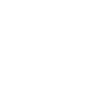

In [8]:
solar_wind_df[solar_wind_df.id == 'w114454922'].geometry.item() # way - linestring

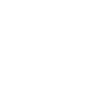

In [9]:
solar_wind_df[solar_wind_df.id == 'a228909844'].geometry.item() # area - multipolygon

In [10]:
solar_wind_df[solar_wind_df.id == 'w114454922']

,id,lat,lon,power_tag,power_method,power_source,power_type,geometry,relation_id,relation_type,relation_info,nodesID_in_way,way_coordinates,nodesID_in_area,area_coordinates
5898,w114454922,NaN,NaN,generator,photovoltaic,solar,solar_photovoltaic_panel,"LINESTRING (-8.0363875 52.9469856, -8.0363864 ...",NaN,NaN,NaN,"[1296558438, 1880150697, 1880150696, 188015069...","[(52.9469856, -8.0363875), (52.9470196, -8.036...",NaN,NaN


In [11]:
solar_wind_df[solar_wind_df.id == 'a228909844']

,id,lat,lon,power_tag,power_method,power_source,power_type,geometry,relation_id,relation_type,relation_info,nodesID_in_way,way_coordinates,nodesID_in_area,area_coordinates
5899,a228909844,NaN,NaN,generator,photovoltaic,solar,solar_photovoltaic_panel,"MULTIPOLYGON (((-8.0364843 52.946839, -8.03578...",NaN,NaN,NaN,NaN,NaN,"[10929051712, 1296558440, 1296558442, 18801507...","[(52.946839, -8.0364843), (52.9468307, -8.0357..."


In [12]:
# the two geometries (when converted to same shapely type) are the same
lstr_indx = solar_wind_df[solar_wind_df.id == 'w114454922'].index.item()
area_indx = solar_wind_df[solar_wind_df.id == 'a228909844'].index.item()

lstr_as_multipoly = shapely.MultiPolygon([shapely.Polygon(solar_wind_df.loc[lstr_indx].geometry)]) 

lstr_as_multipoly.equals_exact(solar_wind_df.loc[area_indx].geometry, tolerance=0.001)

True

In [13]:
# they contain the same sets of nodes
set(solar_wind_df.at[area_indx, 'nodesID_in_area']) == set(solar_wind_df.at[lstr_indx, 'nodesID_in_way'])

True

#### Fix redundancies: use nodes in way/area to check if the object is duplicated
This is a better way than using *equals_exact* method on geometry, as tollerance can play a big role in deciding whether two geometries are the same or not.

In [14]:
# dataframe with only ways and areas
solar_wind_ways_and_areas = solar_wind_df[~solar_wind_df.id.str.startswith('n')].reset_index(drop=True)

# create a unique column with nodes set contained in each area and way (nodesID_in_area + nodesID_in_way as python set)
solar_wind_ways_and_areas['merged_nodes_in_obj'] = np.where(solar_wind_ways_and_areas['nodesID_in_area'].notnull(), solar_wind_ways_and_areas['nodesID_in_area'], solar_wind_ways_and_areas['nodesID_in_way'])
# column type as set
solar_wind_ways_and_areas['merged_nodes_in_obj'] = solar_wind_ways_and_areas.apply(lambda row: set(row['merged_nodes_in_obj']), axis=1)
# bool column: True if object is duplicated
solar_wind_ways_and_areas['duplicated_objs'] = solar_wind_ways_and_areas.merged_nodes_in_obj.duplicated(keep=False) # keep=False mark all duplicated as True


In [15]:
# get all duplicates that are ways --> put them in a list of ids to drop
ids_to_drop = solar_wind_ways_and_areas[(solar_wind_ways_and_areas.duplicated_objs==True)&(solar_wind_ways_and_areas.id.str.startswith('w'))].id.to_list()

In [16]:
# drop them from temporary dataframe and check again if there are duplicated among areas (two or more time the same multipolygon)
solar_wind_ways_and_areas = solar_wind_ways_and_areas[~(solar_wind_ways_and_areas.id.isin(ids_to_drop))].reset_index(drop=True)

# check again if there are duplicated 
solar_wind_ways_and_areas.merged_nodes_in_obj.duplicated(keep=False).any() # False --> no more True value in the duplicated column

False

In [17]:
if solar_wind_ways_and_areas.merged_nodes_in_obj.duplicated(keep=False).any():
    raise ValueError('Re-run duplicates check for duplicated areas!')

In [18]:
# drop duplicates in ids_to_drop from solar_wind_df
solar_wind_df = solar_wind_df[~(solar_wind_df.id.isin(ids_to_drop))].reset_index(drop=True)

In [19]:
print('Found {} objects that were mapped both as ways and areas: duplicated dropped, kept areas.'.format(len(ids_to_drop)))

Found 8891 objects that were mapped both as ways and areas: duplicated dropped, kept areas.


In [20]:
print(f'Final number of solar and wind source: {len(solar_wind_df)}')

Final number of solar and wind source: 14620


In [21]:
len(solar_wind_df[solar_wind_df.id.str.startswith('w')]) # no more ways :)

0

________

According to OSM Tag Wiki, **"power=plant" may be a multipolygon/area or a relation**, while **"power=generator" may be a node, a way or a multipolygon/area**.  
Check if this is respected in the data after this cleansing (it was not before, as plant were mapped as ).

In [22]:
solar_wind_df[solar_wind_df.power_tag=='plant'].id.str.startswith('n').any() # no plants as node

False

In [23]:
solar_wind_df[solar_wind_df.power_tag=='plant'].id.str.startswith('w').any() # no plants as node

False

_____

Check if there are duplicated nodes

In [24]:
solar_wind_nodes_only = solar_wind_df[solar_wind_df.id.str.startswith('n')]

In [25]:
solar_wind_nodes_only.geometry.nunique() == len(solar_wind_nodes_only)

True

In [27]:
# check if there are duplicated nodes with a given tollerance
tol = 0.00001
duplicated_nodes_bool = check_equal_geometries(solar_wind_nodes_only, tolerance=tol)

print('Is there any duplicated node (with {} tollerance): {}'.format(tol, duplicated_nodes_bool))


Is there any duplicated node (with 1e-05 tollerance): False


_________

### Check areas: which nodes belong to which area? 
Areas may be intended as relations among nodes  

Nodes in areas do not represent turbines or PV panels, but rather the vertices of the area; thus, to determine whether a turbine or PV panel belong to an area, we apply point-in-polygon search.

In [28]:
# get areas only 
# areas may be intended as relations among nodes 
# --> check if nodes belong to areas and mark each node belonging to an area (most likely wind/solar farm)
solar_wind_areas = gpd.GeoDataFrame(solar_wind_df[solar_wind_df.id.str.startswith('a')].reset_index(drop=True), geometry='geometry')
solar_wind_nodes = gpd.GeoDataFrame(solar_wind_df[solar_wind_df.id.str.startswith('n')].reset_index(drop=True), geometry='geometry')

In [29]:
nodes_in_areas = point_in_polygon_with_spatial_index(source_gdf=solar_wind_nodes, intersecting_gdf=solar_wind_areas)
nodes_in_areas

,node_id,area_id
0,n4375046818,a879656804
1,n4375046817,a879656804
2,n4864543522,a879656804
3,n4864543521,a879656804
4,n4864543523,a879656804
...,...,...
417,n11418278659,a2462397272
418,n11418278651,a2462397272
419,n11418278660,a2462397272
420,n11576327726,a2490468962


In [30]:
nodes_in_areas.node_id.duplicated().any() # no node belong to multple areas :)

False

In [31]:
if nodes_in_areas.node_id.duplicated().any():
    raise ValueError('One or more nodes (turbines or PV panel) belong to multiple areas! Check it!')

**NOTE**: NEED TO CHECK THAT PT IS OF THE SAME POWER-SOURCE OF THE AREA IT IS IN

E.g., matched such as solar panels inside wind farms, or turbines inside solar areas are not meaningful.

Here it does not happen, but in other countries it may.

In [32]:
# add nodes power source to nodes_in_areas
nodes_in_areas = pd.merge(nodes_in_areas, solar_wind_df[['id', 'power_source']], right_on='id', left_on='node_id', how='left')
nodes_in_areas = nodes_in_areas.rename(columns={'power_source': 'node_power_source'})
nodes_in_areas.drop(columns=['id'], inplace=True)

# add areas power source to nodes_in_areas
nodes_in_areas = pd.merge(nodes_in_areas, solar_wind_df[['id', 'power_source']], right_on='id', left_on='area_id', how='left')
nodes_in_areas = nodes_in_areas.rename(columns={'power_source': 'area_power_source'})
nodes_in_areas.drop(columns=['id'], inplace=True)

# KEEP ONLY PT-IN-AREA MATCHES THAT ARE OF THE SAME TYPE
# e.g., matched such as solar panels inside wind farms, 
# or turbines inside solar areas are not meaningful
nodes_in_areas = nodes_in_areas[nodes_in_areas.node_power_source == nodes_in_areas.area_power_source].reset_index(drop=True)

#### QUESTIONS:
- is there any area not inside nodes_in_areas (namely areas that do not have any power-node belonging to them recorded into the solar_wind_df dataframe)?  
    --> yes, in the case of solar energy, this happens in solar farms, as panels inside solar farms are usually (but not always) not singularly mapped, or for single solar generators ([cfr. wiki](https://wiki.openstreetmap.org/wiki/Tag:generator:source%3Dsolar#Mapping_Photovoltaic_Generators)). In the case of wind energy, it also occurs one time in Ireland data, but this is due to a mapping error.
- are there nodes not belonging to any area? Why?  
    --> yes, private solar installations on rooftops (to discard), or wind farm not found in data (apply clustering)

In [33]:
# is there any area not in nodes_in_area?? 
# namely, areas that do not have single PV panel or turbines mapped

area_without_nodes = []
for area in solar_wind_areas.id.to_list():
    if area not in nodes_in_areas.area_id.to_list():
        area_without_nodes.append(area)


In [34]:
len(area_without_nodes)

8850

AREAS WITHOUT MAPPED POWER-NODES INSIDE:

In [35]:
# ALL AREAS - except 1 - THAT DO NOT HAVE NODES MAPPED IN solar_wind_df ARE SOLAR FARM --> NO NODE FOR PANELS WHEN SOLAR FARMS (NODES ARE SINGLE PANELS ON ROOFTOPS)
solar_wind_areas[(solar_wind_areas.id.isin(area_without_nodes))].power_method.unique()

array(['photovoltaic', 'wind_turbine'], dtype=object)

In [36]:
tot_areas_without_nodes = len(solar_wind_areas[(solar_wind_areas.id.isin(area_without_nodes))])
pv_areas_without_nodes = len( solar_wind_areas[(solar_wind_areas.id.isin(area_without_nodes))&(solar_wind_areas.power_method == 'photovoltaic')] )
wind_areas_without_nodes = len( solar_wind_areas[(solar_wind_areas.id.isin(area_without_nodes))&(solar_wind_areas.power_method == 'wind_turbine')] )

print('Of {} areas without mapped nodes inside, \n - {} of them is/are photovoltaic \n - {} is/are wind turbine(s).'.format(tot_areas_without_nodes, pv_areas_without_nodes, wind_areas_without_nodes))

Of 8850 areas without mapped nodes inside, 
 - 8849 of them is/are photovoltaic 
 - 1 is/are wind turbine(s).


In [37]:
solar_wind_areas[(solar_wind_areas.id.isin(area_without_nodes))&(solar_wind_areas.power_method == 'wind_turbine')]

,id,lat,lon,power_tag,power_method,power_source,power_type,geometry,relation_id,relation_type,relation_info,nodesID_in_way,way_coordinates,nodesID_in_area,area_coordinates
3575,a2073425884,NaN,NaN,plant,wind_turbine,wind,None,"MULTIPOLYGON (((-9.58732 54.12665, -9.58613 54...",NaN,NaN,NaN,NaN,NaN,"[9551050604, 9551050605, 9551050603, 9551050604]","[(54.1266474, -9.58732), (54.1266391, -9.58613..."


**MAPPING ERROR**: Seems like all areas without mapped power-nodes inside are solar farms; the only one area that is not a solar farm seems to be a mapping error (there are actually many turbines around this area, but not inside, as this area is actually an imperceptibly small triangle).

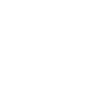

In [38]:
solar_wind_areas[(solar_wind_areas.id.isin(area_without_nodes))&(solar_wind_areas.power_method == 'wind_turbine')].geometry.item()

In [39]:
print(solar_wind_areas[(solar_wind_areas.id.isin(area_without_nodes))&(solar_wind_areas.power_method == 'wind_turbine')].geometry.item())

MULTIPOLYGON (((-9.58732 54.1266474, -9.5861309 54.1266391, -9.5867396 54.1271535, -9.58732 54.1266474)))


In [40]:
# drop mapping error(s)
mistakes_to_drop_id = solar_wind_areas[(solar_wind_areas.id.isin(area_without_nodes))&(solar_wind_areas.power_method == 'wind_turbine')].id.to_list()
print('IDs errors:', mistakes_to_drop_id)

solar_wind_df = solar_wind_df[~solar_wind_df.id.isin(mistakes_to_drop_id)].reset_index(drop=True)

IDs errors: ['a2073425884']


NODES NOT IN AREAS:

In [41]:
# deal with nodes not in any areas
'''
Nodes NOT in areas:
 - for **wind_turbine**, most likely there is a UNMAPPED farm --> run clustering
 - for **photovoltaic**, most likely they are single pannels on rooftops --> less of interest, focus on solar farm, thus may be discarded (or try clustering too)
'''
solar_wind_df[(solar_wind_df.id.str.startswith('n'))&(~solar_wind_df.id.isin(nodes_in_areas.node_id.to_list()))] 

,id,lat,lon,power_tag,power_method,power_source,power_type,geometry,relation_id,relation_type,relation_info,nodesID_in_way,way_coordinates,nodesID_in_area,area_coordinates
0,n370577265,52.273302,-7.344967,generator,wind_turbine,wind,horizontal_axis,POINT (-7.3449668 52.2733022),15261309.0,site,wind_farm,NaN,NaN,NaN,NaN
1,n370577267,52.272950,-7.341947,generator,wind_turbine,wind,horizontal_axis,POINT (-7.3419466 52.2729497),15261309.0,site,wind_farm,NaN,NaN,NaN,NaN
2,n410873377,52.658500,-6.726101,generator,wind_turbine,wind,horizontal_axis,POINT (-6.726101 52.6585004),14995512.0,site,wind_farm,NaN,NaN,NaN,NaN
3,n410873379,52.660736,-6.728386,generator,wind_turbine,wind,horizontal_axis,POINT (-6.7283858 52.6607361),14995512.0,site,wind_farm,NaN,NaN,NaN,NaN
4,n410873382,52.656670,-6.723020,generator,wind_turbine,wind,horizontal_axis,POINT (-6.7230195 52.6566697),14995512.0,site,wind_farm,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5714,n11591843982,54.283681,-7.057433,generator,photovoltaic,solar,solar_photovoltaic_panel,POINT (-7.0574333 54.2836813),NaN,NaN,NaN,NaN,NaN,NaN,NaN
5715,n11592136122,54.273677,-7.064891,generator,photovoltaic,solar,solar_photovoltaic_panel,POINT (-7.064891 54.2736769),NaN,NaN,NaN,NaN,NaN,NaN,NaN
5716,n11592136131,54.284469,-7.065002,generator,photovoltaic,solar,solar_photovoltaic_panel,POINT (-7.0650019 54.2844694),NaN,NaN,NaN,NaN,NaN,NaN,NaN
5717,n11592136166,54.276488,-7.068346,generator,photovoltaic,solar,solar_photovoltaic_panel,POINT (-7.068346 54.2764883),NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [47]:
# number of nodes not in area per source
solar_wind_df[(solar_wind_df.id.str.startswith('n'))&(~solar_wind_df.id.isin(nodes_in_areas.node_id.to_list()))].groupby('power_source').aggregate({'id':'count'})

,id
power_source,
solar,2380
wind,2917


In [50]:
# total nodes per sourcemo
solar_wind_df[solar_wind_df.id.str.startswith('n')].groupby('power_source').aggregate({'id':'count'}) 

,id
power_source,
solar,2380
wind,3339


In [52]:
# percentage of nodes not in area over total number of nodes per source
solar_wind_df[(solar_wind_df.id.str.startswith('n'))&(~solar_wind_df.id.isin(nodes_in_areas.node_id.to_list()))].groupby('power_source').aggregate({'id':'count'}) * 100 / solar_wind_df[solar_wind_df.id.str.startswith('n')].groupby('power_source').aggregate({'id':'count'}) 

,id
power_source,
solar,100.000000
wind,87.361485


SOLAR NOT IN AREAS:

In [ ]:
# get only PV panels not in any area --> are they actually only single installations on rooftops (to be discarded)?
nodes_pv_not_in_areas = solar_wind_df[(solar_wind_df.id.str.startswith('n'))&(~solar_wind_df.id.isin(nodes_in_areas.node_id.to_list()))&(solar_wind_df.power_source == 'solar')]
nodes_pv_not_in_areas = gpd.GeoDataFrame(nodes_pv_not_in_areas.reset_index(drop=True), geometry='geometry')

In [ ]:
nodes_pv_not_in_areas.power_method.unique(), nodes_pv_not_in_areas.power_type.unique()

(array(['photovoltaic', 'solar_thermal', 'thermal', None], dtype=object),
 array(['solar_photovoltaic_panel', 'solar_thermal_panel',
        'solar_thermal_collector', None], dtype=object))

In [ ]:
nodes_pv_not_in_areas.relation_id.unique() # never in relations

array([nan])

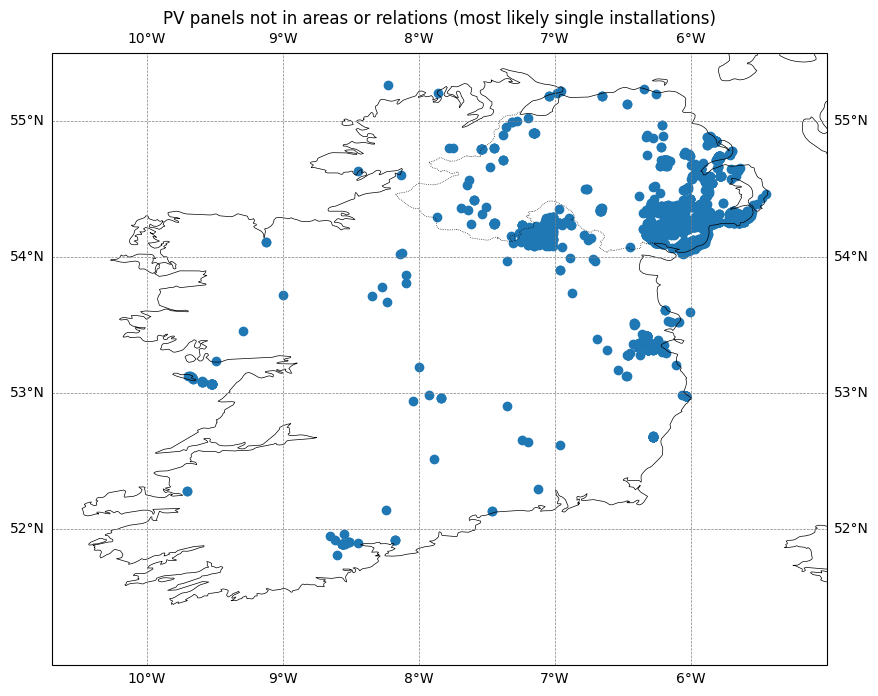

In [ ]:
### plot
fig, ax = plt.subplots(figsize=(10, 8), subplot_kw={'projection': ccrs.PlateCarree()})
ax.set_extent([-10.7, -5, 51, 55.5])  # long-lat boundaries
ax.add_feature(cfeature.COASTLINE, edgecolor='black', linewidth=0.5)
ax.add_feature(cfeature.BORDERS, linestyle=':', edgecolor='black', linewidth=0.5)
ax.gridlines(draw_labels=True, linewidth=0.5, color='gray', linestyle='--')

nodes_pv_not_in_areas.plot(ax=ax)

ax.set_title('PV panels not in areas or relations (most likely single installations)')

plt.show()

In [ ]:
nodes_pv_not_in_areas.power_tag.unique() # pv panels not in areas or relations are all generators

array(['generator'], dtype=object)

In [ ]:
len(nodes_pv_not_in_areas.id.to_list())

2380

According to these observations, and considering the wiki of [Tag:generator:source=solar](https://wiki.openstreetmap.org/wiki/Tag:generator:source%3Dsolar), generators with solar source, are **OSM nodes** only when representing a rooftop solar panel or a solar thermal collector placed on private roofs.  
Therefore all solar generators mapped as nodes can be discarded as single private installations, and not solar farms.

In [ ]:
# drop single installation of solar generators on rooftops
solar_wind_df = solar_wind_df[~solar_wind_df.id.isin(nodes_pv_not_in_areas.id.to_list())]

WIND NOT IN AREAS OR RELATIONS:

NOTE: some wind farms may be mapped but they DO NOT have a power tag, and therefore not collected by the PowerHandler (example: [Relation: Elliot's Hill wind farm (16122973)](https://www.openstreetmap.org/relation/16122973) ). This can be considered a rare case, as the *power* tag is the only wide used OSM tag for power sources data.

In [ ]:
# get only wind turbines nodes not in any area 
nodes_wind_not_in_areas = solar_wind_df[(solar_wind_df.id.str.startswith('n'))&(~solar_wind_df.id.isin(nodes_in_areas.node_id.to_list()))&(solar_wind_df.power_source == 'wind')]

# consider only turbines not in areas that are also not in relations
nodes_wind_not_in_areas = nodes_wind_not_in_areas[nodes_wind_not_in_areas.relation_id.isnull()].reset_index(drop=True)

nodes_wind_not_in_areas = gpd.GeoDataFrame(nodes_wind_not_in_areas, geometry='geometry', crs='EPSG:4326')

print('{} wind turbines are not in areas or relations.'.format(len(nodes_wind_not_in_areas)))

678 wind turbines are not in areas or relations.


May perform clustering on my wind turbine data to discover if they belong to the same wind farm or if they are standalone wind turbines.  
Incorporate the following information concerning distances between turbines: in general for onshore wind turbines belonging to the same farm the distance between one another should be between 3 and 5 rotor diameters, and onshore wind turbine rotor diameters can reach 130 meters. OSM data lack exhaustive information about turbine rotor diameters, so can use the average value of 130 meters for all turbines.  
A clustering algorithm that may incorporate these information and that is based on distance can be **DBSCAN**: tuning the epsilon parameter I can put a threshold on maximum distance for turbines to belong to the same cluster.

In [ ]:
wind_nodes_to_cluster = gpd.GeoDataFrame(solar_wind_df[solar_wind_df.power_source=='wind'], geometry='geometry', crs='EPSG:4326')
wind_nodes_to_cluster = wind_nodes_to_cluster[wind_nodes_to_cluster.id.str.startswith('n')].reset_index(drop=True)

In [ ]:
# TO METRIC SYSTEM --> CLUSTER BASED ON DISTANCE IN METERS
epsg_meter = 'EPSG:3035'
wind_nodes_to_cluster_metric = wind_nodes_to_cluster.to_crs(epsg_meter)
wind_nodes_to_cluster_metric['lon'], wind_nodes_to_cluster_metric['lat'] = wind_nodes_to_cluster_metric.geometry.x, wind_nodes_to_cluster_metric.geometry.y

In [ ]:
# DBSCAN parameters:
# eps: maximum distance between two samples for one to be considered as in the neighborhood of the other
avg_rotor_diameter = 130 # meters
eps = 5*avg_rotor_diameter # 5 times the rotor diameter
# min_samples: number of samples in a neighborhood for a point to be considered as a core point. This includes the point itself. 
# If min_samples is set to a higher value, DBSCAN will find denser clusters, whereas if it is set to a lower value, the found clusters will be more sparse.
min_samples = 2 # minimum 2 turbines per cluster

# apply DBSCAN clustering
clusterer = DBSCAN(eps = eps, 
                   min_samples = min_samples,
                   metric = 'euclidean') 
clusterer.fit(wind_nodes_to_cluster_metric[['lon', 'lat']])

DBSCAN(eps=650, min_samples=2)

In [ ]:
# add labels computed on metric dataframe to LON/LAT dataframe 
wind_nodes_to_cluster['cluster'] = clusterer.labels_
wind_nodes_to_cluster['cluster'].nunique() # number of clusters

360

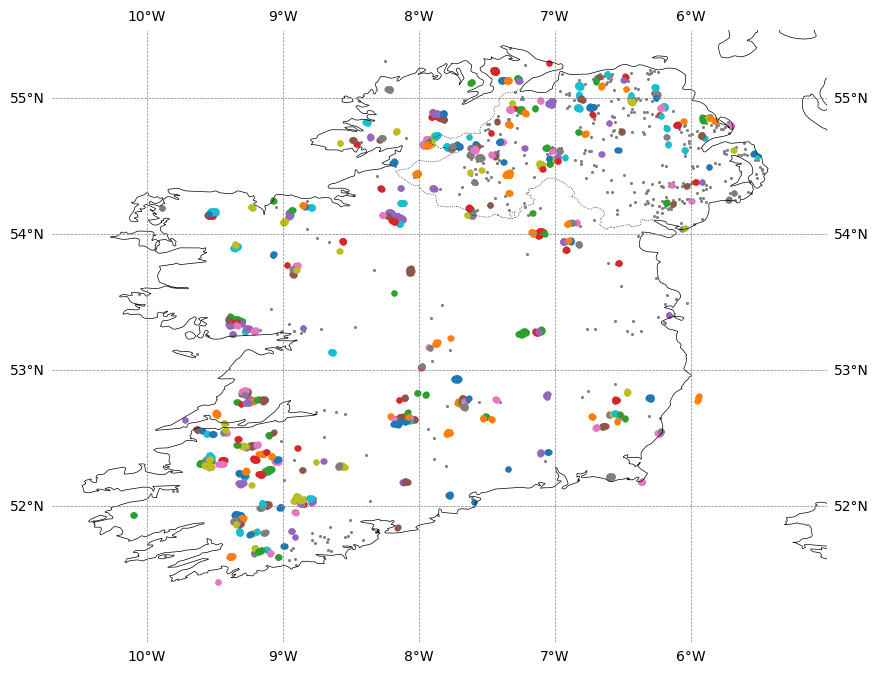

In [ ]:
def plot_dbscan_clustering(gdf, figsize=(10, 10)):
    ### plot
    fig, ax = plt.subplots(figsize=figsize, subplot_kw={'projection': ccrs.PlateCarree()})

    # basemap
    ax.set_extent([-10.7, -5, 51, 55.5])  # long-lat boundaries
    
    # external boundaries
    ax.add_feature(cfeature.COASTLINE, edgecolor='black', linewidth=0.5)

    # internal boundaries
    ax.add_feature(cfeature.BORDERS, linestyle=':', edgecolor='black', linewidth=0.5)

    # grid & coords labels
    ax.gridlines(draw_labels=True, linewidth=0.5, color='gray', linestyle='--')

    # handle points that are not part of any cluster (noise)
    noise = gdf[gdf['cluster'] == -1]
    ax.scatter(noise.geometry.x, noise.geometry.y, c='grey', s=5, linewidth=0)

    # plot all points that are not noise, with different colors based on their cluster label
    unique_labels = gdf['cluster'].unique()
    for label in unique_labels:
        if label == -1:
            continue  
        cluster_points = gdf[gdf['cluster'] == label]
        ax.scatter(cluster_points.geometry.x, cluster_points.geometry.y, 
                   label=f'Cluster {label}', s=20, linewidth=0)  

    ax.set_axis_off()
    plt.show()


# grey small dots are standalone wind turbined, while bigger colored dots are farms according to DBSCAN results
plot_dbscan_clustering(wind_nodes_to_cluster) 

In [ ]:
print('Found {} turbines belongs to farms, while {} are standalone wind turbines.'.format(len(wind_nodes_to_cluster[wind_nodes_to_cluster.cluster != -1]), len(wind_nodes_to_cluster[wind_nodes_to_cluster.cluster == -1])))

Found 2891 turbines belongs to farms, while 448 are standalone wind turbines.


In [ ]:
# isolate noise (standalone turbines) --> perhaps they are ongoing projects (i.e., more wind turbines will be added in the future) or some turbines are not mapped on OSM
standalone_turbines = wind_nodes_to_cluster[wind_nodes_to_cluster.cluster == -1].id.to_list()

#### Check correspondance of clustering results with OSM areas/relations

First, consider **STANDALONE TURBINES**, and whether OSM put them into (1) relations, and (2) areas:

OSM relations:

In [ ]:
# standalone turbines in OSM RELATION 
standalone_in_rel = wind_nodes_to_cluster[(wind_nodes_to_cluster.cluster == -1)&(wind_nodes_to_cluster.relation_id.isnull()==False)]
len(standalone_in_rel)

30

In [ ]:
standalone_in_rel.relation_id.nunique() # 17 relations

17

In [ ]:
# relations not identified by clustering
not_found_rel = standalone_in_rel.relation_id.unique()

df_rel_not_found = wind_nodes_to_cluster[wind_nodes_to_cluster.relation_id.isin(not_found_rel)]
df_rel_not_found.cluster.unique() # relations not found clustered in all these different groups

array([ 13,  -1,  41,  42,  53,  79, 162, 163, 164, 165, 195, 198, 206,
       213, 214, 234, 239, 240,  73, 252, 268, 269, 292, 293, 294, 308,
       312, 313, 314, 315, 316, 329])

In [ ]:
# how many turbines for each relation --> discard if only ONE
n_turb_in_rel = df_rel_not_found.groupby(['relation_id']).aggregate({'relation_id':'count'}).rename(columns={'relation_id':'cnt_turbines_in_rel'}).reset_index()
n_turb_in_rel

,relation_id,cnt_turbines_in_rel
0,9767339.0,5
1,13068833.0,58
2,14139554.0,32
3,14167417.0,19
4,14167757.0,29
5,14171003.0,26
6,14355570.0,22
7,14383054.0,3
8,14473018.0,21
9,15016233.0,6


In [ ]:
# discard if only ONE turbine in relation
single_turb_in_rel = n_turb_in_rel[n_turb_in_rel.cnt_turbines_in_rel < 2].relation_id.to_list()

df_rel_not_found = df_rel_not_found[~df_rel_not_found.relation_id.isin(single_turb_in_rel)].reset_index(drop=True)
wind_nodes_to_cluster = wind_nodes_to_cluster[~wind_nodes_to_cluster.relation_id.isin(single_turb_in_rel)].reset_index(drop=True)
solar_wind_df = solar_wind_df[~solar_wind_df.relation_id.isin(single_turb_in_rel)].reset_index(drop=True)

In [ ]:
df_rel_not_found.groupby(['relation_id']).aggregate({'cluster':set})

,cluster
relation_id,
9767339.0,"{198, -1}"
13068833.0,"{162, 163, 164, 165, -1}"
14139554.0,"{42, 13, -1}"
14167417.0,"{268, 269, -1}"
14167757.0,"{240, 73, -1, 239}"
14171003.0,"{234, 308, 213, 214, -1}"
14355570.0,"{162, 312, 313, 314, 315, 316, -1}"
14383054.0,"{195, -1}"
14473018.0,"{292, 293, 294, -1}"


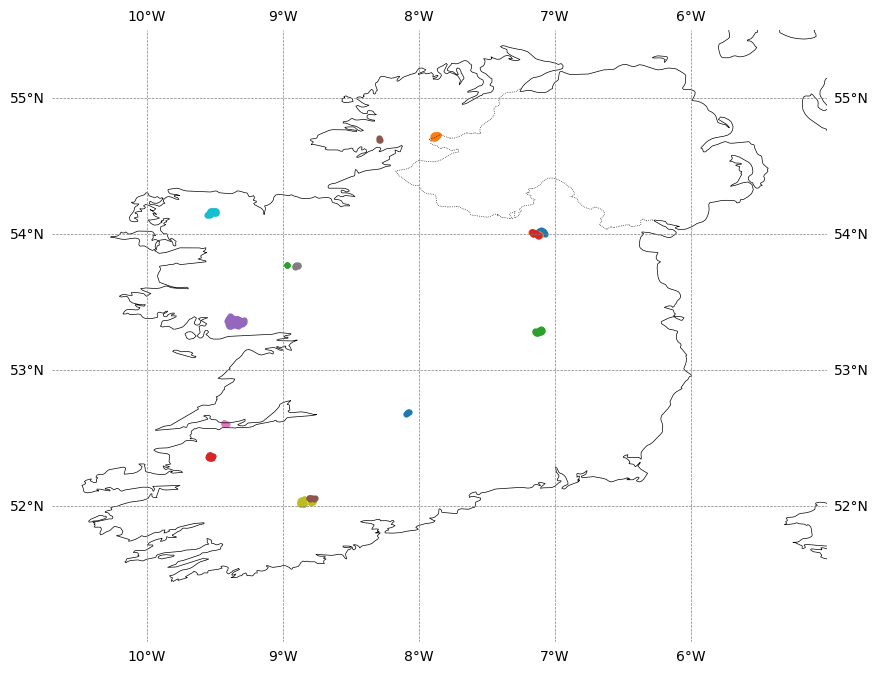

In [ ]:
def plot_grp_by_attribute(gdf, figsize=(10, 10), attribute='relation_id'):
    ### plot
    fig, ax = plt.subplots(figsize=figsize, subplot_kw={'projection': ccrs.PlateCarree()})

    # basemap
    ax.set_extent([-10.7, -5, 51, 55.5])  # long-lat boundaries
    
    # external boundaries
    ax.add_feature(cfeature.COASTLINE, edgecolor='black', linewidth=0.5)

    # internal boundaries
    ax.add_feature(cfeature.BORDERS, linestyle=':', edgecolor='black', linewidth=0.5)

    # grid & coords labels
    ax.gridlines(draw_labels=True, linewidth=0.5, color='gray', linestyle='--')

    # plot all points that are not noise, with different colors based on their cluster label
    unique_labels = gdf[attribute].unique()
    for label in unique_labels:
        if label == -1:
            continue  
        cluster_points = gdf[gdf[attribute] == label]
        ax.scatter(cluster_points.geometry.x, cluster_points.geometry.y, s=20, linewidth=0)  

    ax.set_axis_off()
    plt.show()


# PLOT UNASIGNED TURBINES ACCORDING TO OSM RELATION
plot_grp_by_attribute(df_rel_not_found)

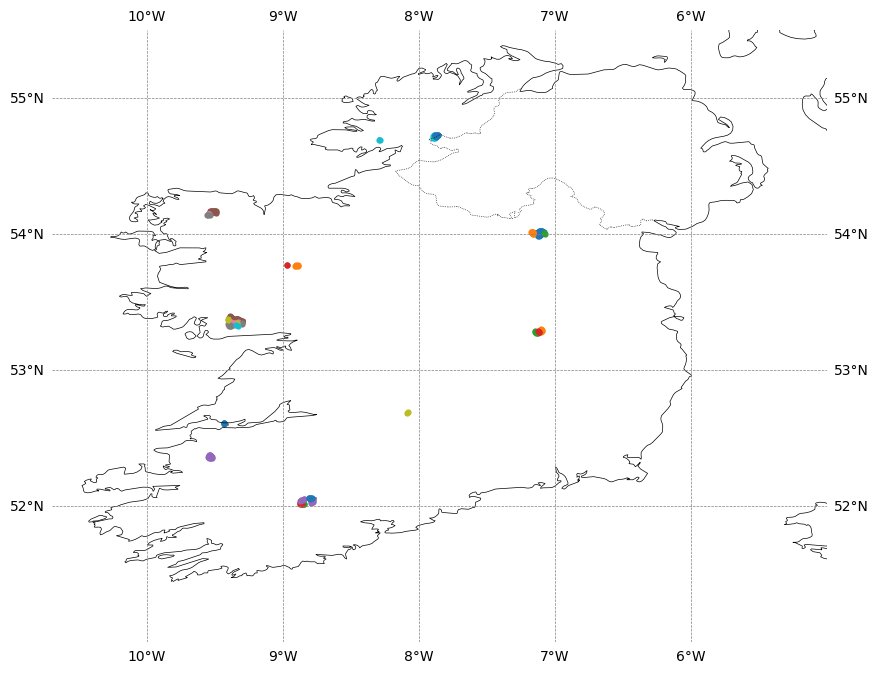

In [ ]:
# PLOT UNASIGNED TURBINES ACCORDING TO CLUSTER
plot_dbscan_clustering(df_rel_not_found) 

Cluster results seems to be more fragmented than the relations identified via OSM: **merge** the two information.  
Turbines assigned to multiple clusters but belonging to the same OSM relation, are merged together in a single cluster.

In [ ]:
def merge_OSM_and_DBSCAN_info(df_OSMinfo_not_found, df_to_update, osm_info='relation_id', dbscan_info='cluster'):
    '''Merge DBSCAN clusters according to OSM area/relation information.'''
    clusters_to_grp = df_OSMinfo_not_found.groupby([osm_info]).aggregate({dbscan_info:set}).reset_index()

    # remove -1
    def remove_minus_one(s):
        if not s:
            return {-2}  # if a set is empty, put a new cluster value (-2)
        else:
            return s - {-1} # remove -1 (DBSCAN noise)
    clusters_to_grp[dbscan_info] = clusters_to_grp[dbscan_info].apply(lambda x: remove_minus_one(x))

    # merge clusters according to relations (for -1 turbines found in OSM relations)
    for rel_id in clusters_to_grp[osm_info]:
        new_cluster = clusters_to_grp[clusters_to_grp[osm_info] == rel_id][dbscan_info].item().pop()
        subset = df_to_update[df_to_update[osm_info]==rel_id]
        subset[dbscan_info] = new_cluster
        df_to_update.update(subset) # update overall dataset

    return df_to_update

wind_nodes_to_cluster = merge_OSM_and_DBSCAN_info(df_OSMinfo_not_found = df_rel_not_found, 
                                                    df_to_update = wind_nodes_to_cluster)

OSM areas:

In [ ]:
# standalone turbines in OSM AREAS

# add area_id (OSM areas of belonging) as column to wind_nodes_to_cluster
wind_nodes_to_cluster['area_id'] = None
for node in range(len(nodes_in_areas)):
    node_id = nodes_in_areas.at[node, 'node_id']
    area_id = nodes_in_areas.at[node, 'area_id']
    wind_nodes_to_cluster.loc[wind_nodes_to_cluster['id'] == node_id, 'area_id'] = area_id

In [ ]:
wind_standalone_in_areas = wind_nodes_to_cluster[(wind_nodes_to_cluster.cluster == -1)&(wind_nodes_to_cluster.area_id.isnull()==False)]
wind_standalone_in_areas

,id,lat,lon,power_tag,power_method,power_source,power_type,geometry,relation_id,relation_type,relation_info,nodesID_in_way,way_coordinates,nodesID_in_area,area_coordinates,cluster,area_id
2844,n9685452099,54.439169,-7.582806,generator,wind_turbine,wind,horizontal_axis,POINT (-7.58281 54.43917),NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1,a2107871826
2848,n9688053466,54.596632,-7.032525,generator,wind_turbine,wind,horizontal_axis,POINT (-7.03253 54.59663),NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1,a2108428532
2888,n9714236389,54.618881,-7.055327,generator,wind_turbine,wind,horizontal_axis,POINT (-7.05533 54.61888),NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1,a2114443254
3080,n10565433860,53.261930,-9.564263,generator,wind_turbine,wind,horizontal_axis,POINT (-9.56426 53.26193),NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1,a2267947762


In [ ]:
len(wind_standalone_in_areas)

4

In [ ]:
cnt_nodes_in_unfound_area = wind_nodes_to_cluster[wind_nodes_to_cluster.area_id.isin(wind_standalone_in_areas.area_id)].groupby(['area_id']).aggregate({'area_id':'count'}).rename(columns={'area_id':'cnt_turbines_in_area'}).reset_index()
cnt_nodes_in_unfound_area

,area_id,cnt_turbines_in_area
0,a2107871826,1
1,a2108428532,1
2,a2114443254,1
3,a2267947762,1


In [ ]:
# if there are area with multiple turbines, can update the clustering info as before (here none)
not_found_areas = cnt_nodes_in_unfound_area[cnt_nodes_in_unfound_area.cnt_turbines_in_area > 1].reset_index(drop=True)

if len(not_found_areas) > 0:    
    not_found_area = not_found_areas.area_id.unique()
    df_area_not_found = wind_nodes_to_cluster[wind_nodes_to_cluster.area_id.isin(not_found_area)]
    wind_nodes_to_cluster = merge_OSM_and_DBSCAN_info(df_OSMinfo_not_found = df_area_not_found, 
                                                      df_to_update = wind_nodes_to_cluster, 
                                                      osm_info='area_id', dbscan_info='cluster')

# all other areas with a single turbine in it can be discarded
single_turbines_in_area = cnt_nodes_in_unfound_area[cnt_nodes_in_unfound_area.cnt_turbines_in_area == 1].area_id.to_list()
ids_single_turbinesin_area = wind_nodes_to_cluster[wind_nodes_to_cluster.area_id.isin(single_turbines_in_area)].id.to_list()

wind_nodes_to_cluster = wind_nodes_to_cluster[~wind_nodes_to_cluster.area_id.isin(single_turbines_in_area)].reset_index(drop=True)
solar_wind_df = solar_wind_df[~solar_wind_df.id.isin(ids_single_turbinesin_area)].reset_index(drop=True) # nodes
solar_wind_df = solar_wind_df[~solar_wind_df.id.isin(single_turbines_in_area)].reset_index(drop=True) # areas
nodes_in_areas = nodes_in_areas[~nodes_in_areas.area_id.isin(single_turbines_in_area)].reset_index(drop=True)

Discard all turbines **NOT** in OSM relations or area, and **NOT** in DBSCAN clustering

In [ ]:
# discard all others turbines NOT in OSM relations or area, and NOT in DBSCAN clustering
standalone_turbines = wind_nodes_to_cluster[wind_nodes_to_cluster.cluster == -1].id.to_list()

wind_nodes_to_cluster = wind_nodes_to_cluster[~wind_nodes_to_cluster.id.isin(standalone_turbines)].reset_index(drop=True)
solar_wind_df = solar_wind_df[~solar_wind_df.id.isin(standalone_turbines)].reset_index(drop=True)

#### Consider **turbines assigned to clusters**: how well does clustering match OSM relation/area data? 
Are there mapping errors, or are clusters too sparse?  
--> here, evaluated the correspondance between OSM data and DBSCAN results (good), and merged some DBSCAN clusters according to OSM areas/relations.

In [ ]:
# rows with same area_id should also have save cluster --> check this! If nunique greater than 1, than for that area_id multiple clusters are defined
cluster_per_area = wind_nodes_to_cluster.groupby('area_id')['cluster'].nunique().reset_index()
areas_with_multiple_clusters = cluster_per_area[cluster_per_area.cluster != 1].area_id.to_list()
areas_with_multiple_clusters

['a2003843654', 'a2156789254']

In [ ]:
print('{} cluster-area matched out of {}'.format(len(cluster_per_area)-len(areas_with_multiple_clusters), len(cluster_per_area)))

45 cluster-area matched out of 47


In [ ]:
multiple_cluster_df = wind_nodes_to_cluster[wind_nodes_to_cluster.area_id.isin(areas_with_multiple_clusters)]

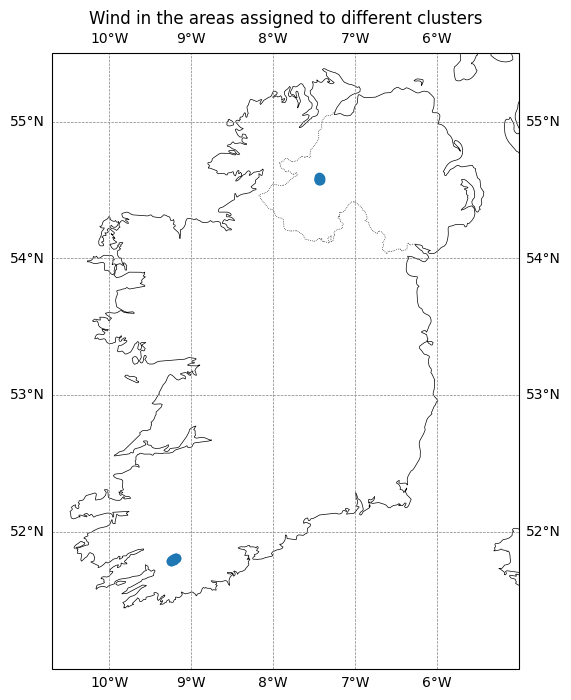

In [ ]:
### plot
fig, ax = plt.subplots(figsize=(10, 8), subplot_kw={'projection': ccrs.PlateCarree()})
ax.set_extent([-10.7, -5, 51, 55.5])  # long-lat boundaries
ax.add_feature(cfeature.COASTLINE, edgecolor='black', linewidth=0.5)
ax.add_feature(cfeature.BORDERS, linestyle=':', edgecolor='black', linewidth=0.5)
ax.gridlines(draw_labels=True, linewidth=0.5, color='gray', linestyle='--')

multiple_cluster_df.plot(ax=ax) 

ax.set_title('Wind in the areas assigned to different clusters')

plt.show()

In [ ]:
# merge clusters according to OSM area info
OSM_area_info_mismatch = wind_nodes_to_cluster[wind_nodes_to_cluster.area_id.isin(areas_with_multiple_clusters)]
wind_nodes_to_cluster = merge_OSM_and_DBSCAN_info(OSM_area_info_mismatch, wind_nodes_to_cluster, osm_info='area_id', dbscan_info='cluster')

Relations:

In [ ]:
# rows with same relation_id should also have save cluster (cluster count should be 1 --> if greater, there are turbines of same OSM relation belonging to different clusters)
cluster_per_relation = wind_nodes_to_cluster.groupby('relation_id')['cluster'].nunique().reset_index()
rel_in_multiple_clusters = cluster_per_relation[cluster_per_relation.cluster != 1].relation_id.unique()
len(rel_in_multiple_clusters)

33

In [ ]:
print('{} cluster-relation matched out of {}'.format(len(cluster_per_relation)-len(rel_in_multiple_clusters), len(cluster_per_relation)))

195 cluster-relation matched out of 228


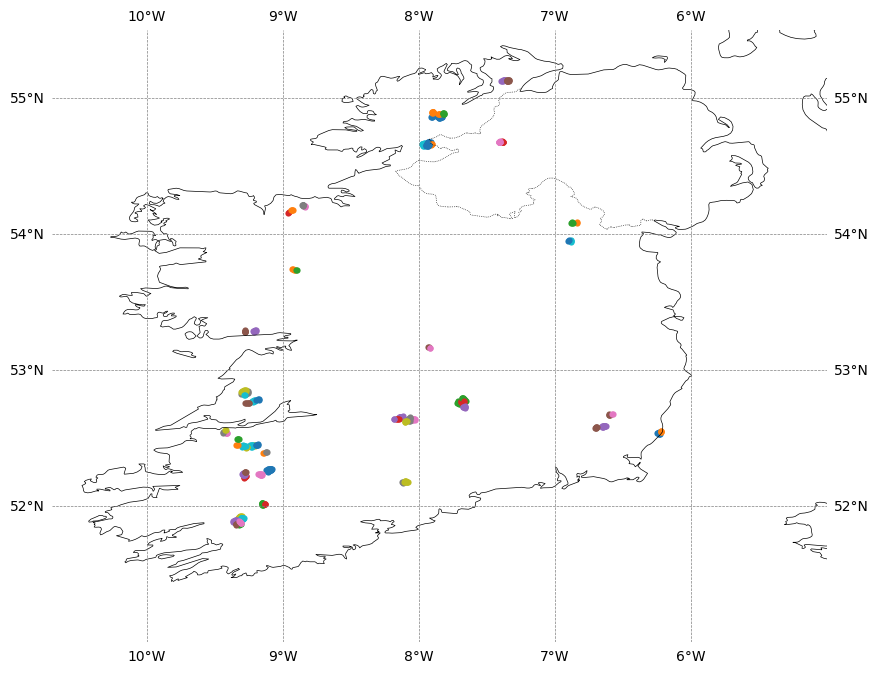

In [ ]:
plot_dbscan_clustering(wind_nodes_to_cluster[wind_nodes_to_cluster.relation_id.isin(rel_in_multiple_clusters)])

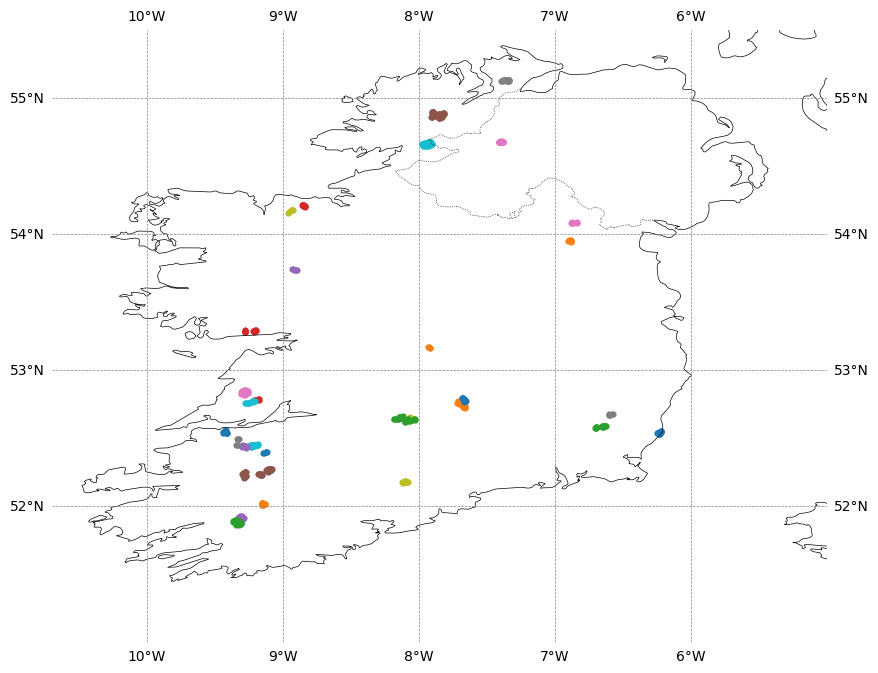

In [ ]:
plot_grp_by_attribute(wind_nodes_to_cluster[wind_nodes_to_cluster.relation_id.isin(rel_in_multiple_clusters)],
                      attribute='relation_id') 

In [ ]:
wind_nodes_to_cluster[wind_nodes_to_cluster.relation_id.isin(rel_in_multiple_clusters)].relation_info.unique()

array(['wind_farm'], dtype=object)

In [ ]:
wind_nodes_to_cluster[wind_nodes_to_cluster.relation_id.isin(rel_in_multiple_clusters)].relation_type.unique()

array(['site'], dtype=object)

In [ ]:
# merge clusters according to OSM relation info
OSM_rel_info_mismatch = wind_nodes_to_cluster[wind_nodes_to_cluster.relation_id.isin(rel_in_multiple_clusters)]
wind_nodes_to_cluster = merge_OSM_and_DBSCAN_info(OSM_rel_info_mismatch, wind_nodes_to_cluster, osm_info='relation_id', dbscan_info='cluster')

Finalize clustering results:

In [ ]:
if len(wind_nodes_to_cluster[wind_nodes_to_cluster.cluster == -1]) != 0:
    raise ValueError('Standaloen turbines - assigned to cluster -1 - are still present in the dataset.')

In [ ]:
if len(solar_wind_df[(solar_wind_df.id.str.startswith('n'))&(solar_wind_df.power_source=='wind')]) != len(wind_nodes_to_cluster):
    raise ValueError('Mismatch between number of wind-related nodes in solar_wind_df, and the nodes clustered.')

In [ ]:
# clustering results
clustered_wind_farms = wind_nodes_to_cluster[['id', 'cluster']]
clustered_wind_farms

,id,cluster
0,n370577265,0
1,n370577267,0
2,n410873377,1
3,n410873379,1
4,n410873382,1
...,...,...
2915,n11521750371,357
2916,n11521750372,357
2917,n11521750373,357
2918,n11576327724,358


In [ ]:
clustered_wind_farms.cluster.value_counts().mean() # avg number of turbines per cluster

9.668874172185431

_________

#### Other solar to discard
- larger installations on rooftops
- single generators (check whether generator-tagged object are correct: mapping errors may be present - perhaps tehy are plants instead?)

In [ ]:
solar_wind_gdf = gpd.GeoDataFrame(solar_wind_df, geometry='geometry', crs= 'EPSG:4326')
solar_gdf = solar_wind_gdf[solar_wind_gdf.power_source == 'solar']

In [ ]:
solar_gdf[solar_gdf.relation_id.isnull()==False]

,id,lat,lon,power_tag,power_method,power_source,power_type,geometry,relation_id,relation_type,relation_info,nodesID_in_way,way_coordinates,nodesID_in_area,area_coordinates


In [ ]:
len(solar_gdf)

8849

In [ ]:
# SOLAR GENERATORS ONLY
m = folium.Map(location=[53.5,-8], zoom_start=7)

# to geojson
solar_json = solar_gdf[solar_gdf.power_tag == 'generator'].to_json()

folium.GeoJson(solar_json, color='red',
               tooltip=folium.GeoJsonTooltip(fields=['id'], 
                                              aliases=['ID'])).add_to(m)

folium.LayerControl().add_to(m)

m

In [ ]:
# if computationally feasible, may try to filter geometries on top of buildings
# however, this strategy is hardly implementable for countries of bigger size
'''
# collects geometries of buildings 
buildings_handler = BuildingHandler()
buildings_handler.apply_file(input_file)
buildings_df = pd.DataFrame(buildings_handler.buildings)
buildings_gdf = gpd.GeoDataFrame(buildings_df, geometry='geometry', crs='EPSG:4326')

# point-in-polygon search (with FULL CONTAINEMENT, not intersection)
solar_on_rooftops = point_in_polygon_with_spatial_index(source_gdf=solar_gdf, intersecting_gdf=buildings_gdf, pt_in_poly_function='contains')
solar_on_rooftops = solar_on_rooftops.rename(columns={'gdf1_geom_id':'solar_installation_id', 'gdf2_area_id':'building_id'})

print('Total solar farms: {}'.format(len(solar_gdf) - len(solar_on_rooftops)))

# filter out solar installations on rooftops
solar_farms_gdf = solar_gdf[~solar_gdf.id.isin(solar_on_rooftops.solar_installation_id.to_list())].reset_index(drop=True)
'''

Check mapping errors on **generators**: consider that they may be plants if they contain at least two other generators.

In [ ]:
solar_gdf_generators = solar_gdf[solar_gdf.power_tag == 'generator'].reset_index(drop=True)

In [ ]:
# find areas in areas
solar_gen_containining_gen = point_in_polygon_with_spatial_index(source_gdf=solar_gdf_generators, intersecting_gdf=solar_gdf_generators, 
                                                                    source_id_col='id', intersecting_id_col='id',
                                                                    pt_in_poly_function = 'contains')
# exclude containement of itself 
solar_gen_containining_gen = solar_gen_containining_gen[solar_gen_containining_gen.gdf1_geom_id != solar_gen_containining_gen.gdf2_area_id].reset_index(drop=True)

In [ ]:
# minimum number of panels to be contained for the containing area to be considered a farm
min_panels = 2

# each area in column gdf2_area_id should appear at least min_panels time 
n_panels_per_area = solar_gen_containining_gen.groupby('gdf2_area_id').size()

solar_gen_containining_gen = solar_gen_containining_gen[solar_gen_containining_gen['gdf2_area_id'].isin(n_panels_per_area[n_panels_per_area >= min_panels].index)]

In [ ]:
solar_gen_containining_gen = solar_gen_containining_gen.rename(columns={'gdf1_geom_id':'single_panel_inside_plant', 'gdf2_area_id':'farm_area'})

In [ ]:
# generators that are actually solar farms
identified_farms = solar_gen_containining_gen.farm_area.unique()
len(identified_farms)

0

In the case of Ireland, it seems no generators actually contains multiple other solar power sources, therefore we do not need to add them to the final dataset. This approach grants that we do not introduce errors in our final dataset, but there is the possibility to discard valid data.  
We keep all solar sources mapped ad *plant* with no additional filtering. 

In [ ]:
# final dataset discarding single generators
solar_gdf = solar_gdf[(solar_gdf.power_tag == 'plant')|(solar_gdf.id.isin(identified_farms))].reset_index(drop=True)

In [ ]:
len(solar_gdf)

42

In [ ]:
# SOLAR
m = folium.Map(location=[53.5,-8], zoom_start=7)

# to geojson
solar_json = solar_gdf.to_json()

folium.GeoJson(solar_json, color='red',
               tooltip=folium.GeoJsonTooltip(fields=['id'], 
                                              aliases=['ID'])).add_to(m)

folium.LayerControl().add_to(m)

m

__________

#### Separate solar and wind sources, and save cleaned datasets

For **solar** sources, the final result is a geodataframe with polygon or multipolygon geometries, each representing a solar farm.  


##### SOLAR

In [ ]:
# TODO / TOFIX: most likely some panels not on solar farms are still retained,
# need to find additional filters, or
# adopt a conservative approach, retaining only SOLAR PLANTS
# or find additional tags that make sure it is a FARM
# (knowing that the retained data are correct BUT
# may also filter out correct geometries wrongly or incompletely tagged)

In [ ]:
# SOLAR SOURCES
print('Geometry types:', set(solar_gdf.id.str[:1].to_list()))

# save
solar_gdf.to_csv('output_data/IE/IE_solar_df.csv')

Geometry types: {'a'}


##### WIND  

For **wind**, areas should be detached from the dataset and their IDs should be add as an additional column in correspondance to the single wind turbines belonging to that area. The final wind generators dataset will be a geodataframe of points, each representing a wind turbine. Each point will be in a relation (relation_id column) and/or in an area (area_id), where relations and areas represent wind farms.

Steps wind turbines:

1. remove offshore turbines
2. detach wind-areas from main dataset, and add area_id column to main dataset (to keep track of which wind farm turbines are in according to OSM areas). As a final result, each point/node/turbine should belong to a farm either via OSM relation, OSM area, or DBSCAN clustering (considering that standalone turbines - cluster -1 - have been filtered out).

In [ ]:
# WIND SOURCES
wind_pts_areas_df = solar_wind_df[solar_wind_df.power_source == 'wind'].reset_index(drop=True)

print('Geometry types:', set(wind_pts_areas_df.id.str[:1].to_list()))

Geometry types: {'n', 'a'}


1. remove offshore turbines: get physical borders data from [Natural Earth](https://www.naturalearthdata.com/downloads/10m-cultural-vectors/10m-admin-0-countries/) to filter out all turbines/areas that are not within the borders, thus on sea.

In [ ]:
# GET PHYSICAL BORDERS DATA FROM [NATURAL EARTH], TO FILTER ONLY INSTALLATIONS INSIDE LAND BORDERS (NOT OFFSHORE)
countries_pysical_borders = gpd.read_file('../data/ne_10m_admin_0_countries.zip')

# Ireland geometry
ie = countries_pysical_borders[countries_pysical_borders.ADMIN=='Ireland'].geometry.item()
# UK geometry (so that we consider also Northern Ireland)
uk = countries_pysical_borders[countries_pysical_borders.ADMIN=='United Kingdom'].geometry.item()

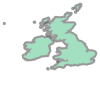

In [ ]:
all_ie = ie.union(uk)
all_ie = all_ie.buffer(0.1)  # add small buffer so that geometries near coast but on land are not filtered out 
all_ie

In [ ]:
crs = 'EPSG:4326'  # WGS84
wind_pts_areas_df = gpd.GeoDataFrame(wind_pts_areas_df, geometry='geometry', crs=crs)

# mask to identify geometries contained within the multipolygon (physical borders)
mask_onshore = wind_pts_areas_df.geometry.within(all_ie)
onshore_solar_wind_df = wind_pts_areas_df[mask_onshore]

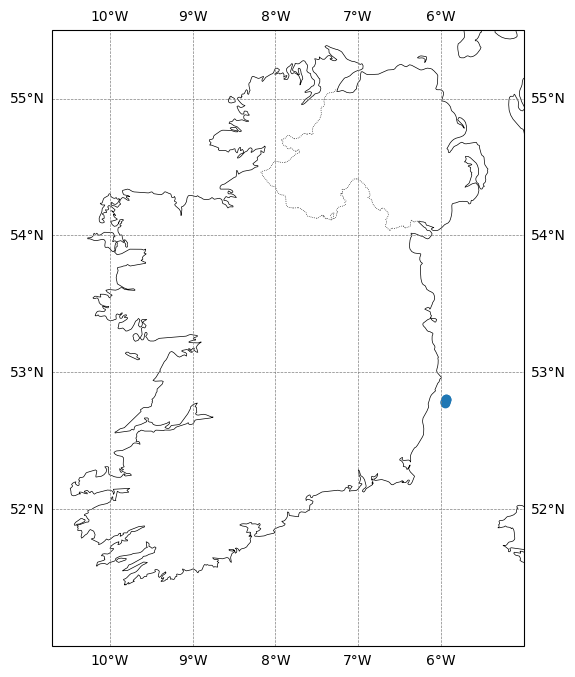

In [ ]:
### plot
fig, ax = plt.subplots(figsize=(10, 8), subplot_kw={'projection': ccrs.PlateCarree()})
ax.set_extent([-10.7, -5, 51, 55.5])  # long-lat boundaries
ax.add_feature(cfeature.COASTLINE, edgecolor='black', linewidth=0.5)
ax.add_feature(cfeature.BORDERS, linestyle=':', edgecolor='black', linewidth=0.5)
ax.gridlines(draw_labels=True, linewidth=0.5, color='gray', linestyle='--')

wind_pts_areas_df[~mask_onshore].plot(ax=ax)

plt.show()

In [ ]:
# INSPECT MAP TO SEE IF CATCHED ALL OFFSHORE TURBINES (IN RED) --> else adjust all_ie buffer
m = folium.Map(location=[53.5,-8], zoom_start=7)

# to geojson
offshore_df = wind_pts_areas_df[~mask_onshore]
wind_off_json = offshore_df.to_json()

wind_on_json = wind_pts_areas_df[mask_onshore].to_json()


folium.GeoJson(wind_off_json, name='Offshore Wind Farms', color='red', 
               marker=folium.Circle(radius=4, fill_color='red', fill_opacity=0.4, color='red', weight=3),
               tooltip=folium.GeoJsonTooltip(fields=['id'], 
                                              aliases=['ID'])).add_to(m)

folium.GeoJson(wind_on_json, name='Onshore Wind Farms', color='green', 
               marker=folium.Circle(radius=4, fill_color='green', fill_opacity=0.4, color='green', weight=3),
               tooltip=folium.GeoJsonTooltip(fields=['id'], 
                                              aliases=['ID'])).add_to(m)

folium.LayerControl().add_to(m)

m


In [ ]:
# filter out offshore turbines
wind_pts_areas_onshore_df = wind_pts_areas_df[mask_onshore].reset_index(drop=True)

2. detach areas and add area_id and cluster_id relations to dataset

In [ ]:
# check
solar_ids = solar_wind_df[solar_wind_df.power_source=='solar'].id.unique() # no solar
offshore_ids = wind_pts_areas_df[~mask_onshore & (wind_pts_areas_df.id.str.startswith('a'))].id.to_list() # offshore farms
filter_out_not_onshore_turbines_sources = np.concatenate([solar_ids, offshore_ids])

nodes_in_wind_areas = nodes_in_areas[~nodes_in_areas.area_id.isin(filter_out_not_onshore_turbines_sources)].reset_index(drop=True)

if nodes_in_wind_areas.area_id.nunique() != wind_pts_areas_onshore_df[wind_pts_areas_onshore_df.id.str.startswith('a')].id.nunique():
    raise ValueError('Inconsistencies between number of areas in wind dataset and areas with nodes inside (wind farms) available.')

In [ ]:
# wind areas (farms) data
wind_areas_df = wind_pts_areas_onshore_df[wind_pts_areas_onshore_df.id.str.startswith('a')].reset_index(drop=True)
wind_areas_df.to_csv('output_data/IE/IE_wind_areas_df.csv')


# wind turbines data
wind_df = wind_pts_areas_onshore_df[wind_pts_areas_onshore_df.id.str.startswith('n')].reset_index(drop=True)
# drop empty columns
wind_df = wind_df.drop(columns=['nodesID_in_area', 'nodesID_in_way', 'way_coordinates', 'area_coordinates'])

In [ ]:
nodes_in_wind_areas

,node_id,area_id,node_power_source,area_power_source
0,n4375046818,a879656804,wind,wind
1,n4375046817,a879656804,wind,wind
2,n4864543522,a879656804,wind,wind
3,n4864543521,a879656804,wind,wind
4,n4864543523,a879656804,wind,wind
...,...,...,...,...
406,n11418278659,a2462397272,wind,wind
407,n11418278651,a2462397272,wind,wind
408,n11418278660,a2462397272,wind,wind
409,n11576327726,a2490468962,wind,wind


In [ ]:
# add area_id as column to wind turbines data (farm which they belong to)
wind_df['area_id'] = None
for node in range(len(nodes_in_wind_areas)):
    node_id = nodes_in_wind_areas.at[node, 'node_id']
    area_id = nodes_in_wind_areas.at[node, 'area_id']
    wind_df.loc[wind_df['id'] == node_id, 'area_id'] = area_id

# do the same for clustering results
wind_df['cluster_id'] = None
for node in range(len(clustered_wind_farms)):
    node_id = clustered_wind_farms.at[node, 'id']
    cluster_id = clustered_wind_farms.at[node, 'cluster']
    wind_df.loc[wind_df['id'] == node_id, 'cluster_id'] = cluster_id

In [ ]:
if len(wind_df[(wind_df.relation_id.isnull())&(wind_df.area_id.isnull())&(wind_df.cluster_id.isnull())]) != 0:
    raise ValueError('All wind turbines should belong to a farm (after filtering out standalone turbines), either via OSM relation, OSM area, or DBSCAN clustering.')

In [ ]:
# PLOT ALL ONSHORE WIND SOURCES
m = folium.Map(location=[53.5,-8], zoom_start=7)

# to geojson
wind_df['cluster_id'] = wind_df['cluster_id'].astype(float) # to be json serializable
wind_turbines_json = gpd.GeoDataFrame(wind_df, geometry='geometry', crs='EPSG:4326').to_json() # nodes df to json
wind_farms_json = gpd.GeoDataFrame(wind_areas_df, geometry='geometry', crs='EPSG:4326').to_json() # areas df to json

folium.GeoJson(wind_turbines_json, name='Wind Turbines', color='green', 
               marker=folium.Circle(radius=4, fill_color='green', fill_opacity=0.4, color='green', weight=3),
               tooltip=folium.GeoJsonTooltip(fields=['id'], 
                                              aliases=['ID'])).add_to(m)

folium.GeoJson(wind_farms_json, name='Wind Farms Areas', color='green', 
               tooltip=folium.GeoJsonTooltip(fields=['id'], 
                                              aliases=['ID'])).add_to(m)

folium.LayerControl().add_to(m)

m

In [ ]:
# save
wind_df.to_csv('output_data/IE/IE_wind_df.csv')

_________

#### Retrieve objects nearby

Objects to keep as important factors for infrastructures locations:
1. ENVIRONMENTAL: 
    - terrain slope
    - distance from protected areas
    - distance from water bodies
    - exposure index
2. CLIMATIC:
    - avg annual precipitation
    - avg annual temperature
    - average annual solar radiation power
    - average annual wind velocity
    - photovoltaic energy potential
3. ANTHROPOGENIC:
    - distance from industrial buildings
    - distance from industrial areas
    - distance from medium voltage grid (powerline)
    - distance from housing developments
    - distance from road
    - landuse
4. SOCIAL:
    - shadow flicker
    - sound impact (noise)
    - visual impact (landscape)
    - propriety values
    - level of economic benefit

References: 
- [Impacts, procedural processes, and local context: Rethinking the social acceptance of wind energy projects in the Netherlands](https://doi.org/10.1016/j.erss.2023.103044)
- [Optimising Photovoltaic Farm Location Using a Capabilities Matrix and GIS](https://doi.org/10.3390/en15186693)
- [The Social Acceptance of Wind Energy: Where we stand and the path ahead](https://publications.jrc.ec.europa.eu/repository/handle/JRC103743)

According to the above findings, from OSM, we select:
- power tags (NODES, WAYS, AREAS)
- roads (as WAYS - for connection)
- protected areas (as AREAS)
- water bodies (AREAS - might be PT but undesirable)
- residential & industrial buildings (usually AREAS but might be central PT)
- residential & industrial landuse (usually AREAS but might be central PT)
- (other landuse may be added but for now keep only industrial and residential for now)

In [ ]:
objs_handler = ImpactFactorsHandler()
objs_handler.apply_file(input_file)
    
all_osm_objs = pd.DataFrame(objs_handler.osm_objects)

In [ ]:
all_osm_objs.tags.astype('str').unique()

array(["{'power': 'tower'}",
       "{'landuse': 'industrial', 'name': 'Cillín Hill', 'place': 'locality'}",
       "{'line_management': 'transition', 'location:transition': 'yes', 'power': 'tower'}",
       ...,
       "{'embankment': 'yes', 'highway': 'unclassified', 'lanes': '2', 'name': 'Derrycarne Road', 'surface': 'asphalt'}",
       "{'bridge': 'yes', 'highway': 'secondary', 'lanes': '2', 'layer': '1', 'maxspeed': '80', 'ref': 'R741', 'surface': 'asphalt'}",
       "{'highway': 'unclassified', 'oneway': 'yes', 'source': 'EEA GMES Urban Atlas'}"],
      dtype=object)

In [ ]:
all_osm_objs 

,id,tags,geometry
0,n278295680,{'power': 'tower'},POINT (-6.331084 53.2787634)
1,n280110551,{'power': 'tower'},POINT (-6.3412764 53.2824241)
2,n280111835,{'power': 'tower'},POINT (-6.3237902 53.2761535)
3,n280111982,{'power': 'tower'},POINT (-6.3201596 53.2747729)
4,n280112733,{'power': 'tower'},POINT (-6.3273906 53.2774483)
...,...,...,...
1373418,n2493743016,"{'natural': 'water', 'water': 'pond'}","MULTIPOLYGON (((-6.4364427 54.4497496, -6.4364..."
1373419,n2493815412,{'landuse': 'residential'},"MULTIPOLYGON (((-9.6733946 53.1245142, -9.6733..."
1373420,n1246997916,{'highway': 'service'},"LINESTRING (-8.6256144 52.0091031, -8.6260724 ..."
1373421,n1246997926,"{'access': 'private', 'highway': 'service', 's...","LINESTRING (-8.6238411 52.0087056, -8.6238036 ..."


In [ ]:
# set all ID to int by replacing n with 1, w with 2 and a with 3
# (needed for rtree Index)
mapping = {'n': '1', 'w': '2', 'a': '3'}

all_osm_objs['id_num'] = all_osm_objs['id'].str[0].replace(mapping) + all_osm_objs['id'].str[1:]
all_osm_objs['id_num'] = all_osm_objs['id_num'].astype(int)

In [ ]:
# solar and wind power sources
wind_df = pd.read_csv('output_data/IE/IE_wind_df.csv', index_col=0)
wind_df['geometry'] = wind_df['geometry'].apply(wkt.loads)

solar_df = pd.read_csv('output_data/IE/IE_solar_df.csv', index_col=0)
solar_df['geometry'] = solar_df['geometry'].apply(wkt.loads)

farms_df = pd.concat([wind_df, solar_df]).reset_index(drop=True)

farms_df['id_num'] = farms_df['id'].str[0].replace(mapping) + farms_df['id'].str[1:]
farms_df['id_num'] = farms_df['id_num'].astype(int)

In [ ]:
# SAVE DATAFRAMES
all_osm_objs.to_csv('output_data/IE/IE_all_osm_objs.csv')
farms_df.to_csv('output_data/IE/IE_farms_df.csv')

In [ ]:
# to metric system
metric_crs='EPSG:3035'
all_osm_objs_metric = gpd.GeoDataFrame(all_osm_objs, crs='EPSG:4326', geometry='geometry').to_crs(metric_crs)

In [ ]:
def apply_buffer(geometry, distance):
    return geometry.buffer(distance)

# change projection power-sources to metric system and apply buffer to geometries
radius_buffer = 500 # meters
farms_df = gpd.GeoDataFrame(farms_df, crs='EPSG:4326', geometry='geometry')
farms_df_metric = farms_df.to_crs(metric_crs)
farms_df_metric['buffered_geometry'] = farms_df_metric['geometry'].apply(lambda geom: apply_buffer(geom, radius_buffer))

In [ ]:
# create an rtree index for all buffered geometries in power-source and for all generic objects geometry in all_osm_objs
# add to rtree index (~4 mins for Dublin_area.pbf)
idx = index.Index()
for i in range(len(all_osm_objs_metric)):
    id, obj = all_osm_objs_metric.at[i, 'id_num'], all_osm_objs_metric.at[i, 'geometry']
    idx.insert(id, obj.bounds)

for i in range(len(farms_df_metric)):
    id, obj = farms_df_metric.at[i, 'id_num'], farms_df_metric.at[i, 'geometry']
    idx.insert(id, obj.bounds)

In [ ]:
# extract info to save in json file from a copy of all_osm_objs where geometries are str to be json-serializable
all_osm_objs_copy = all_osm_objs.copy()
all_osm_objs_copy['geometry'] = all_osm_objs_copy.geometry.astype('str')

In [ ]:
# get polygons (buffers around infrastructures) and all other objs (all other OSM objects that are not generators and plants)
buffers_infrastructures = farms_df_metric.buffered_geometry.to_list()
all_other_objs = all_osm_objs_metric.geometry.to_list()

# look for pts in polygons
infrastructures_surroundings = {}
radius = 500 # meters

for i in range(len(farms_df_metric)):
    # get infrastructure info
    infrastructure_id = farms_df_metric.at[i, 'id_num']
    infrastructure_buffer_geom = farms_df_metric.at[i, 'buffered_geometry']

    # retrieve all objs within the infrastructure_buffer_geom (excluding other generators/plants in df_power_sources_metric)
    objs_within_buffer = list(idx.intersection(infrastructure_buffer_geom.bounds)) # IDs of infrastructures and surrounding objs only
    objs_within_buffer_info = all_osm_objs_copy[all_osm_objs_copy.id_num.isin(objs_within_buffer)].to_dict(orient='records') # add all obj info for each objID in all_osm_objs (as dict)
    
    # store objects around infrastructure
    infrastructures_surroundings[infrastructure_id] = objs_within_buffer_info
    

In [ ]:
infrastructures_surroundings[1598162559]

[{'id': 'n4427664348',
  'tags': {'line_management': 'transition',
   'location:transition': 'yes',
   'power': 'tower'},
  'geometry': 'POINT (-6.1658419 53.4022904)',
  'id_num': 14427664348},
 {'id': 'n3819183',
  'tags': {'highway': 'secondary',
   'lanes': '2',
   'lit': 'no',
   'logainm:ref': '1391620',
   'logainm:url': 'https://www.logainm.ie/1391620.aspx',
   'maxspeed': '60',
   'name': 'Moyne Road',
   'name:en': 'Moyne Road',
   'name:ga': 'Bóthar na Maighne',
   'ref': 'R123',
   'source': 'survey',
   'surface': 'asphalt'},
  'geometry': 'LINESTRING (-6.1571367 53.4105961, -6.1565652 53.4105475, -6.1518894 53.4099779, -6.1512615 53.4099014, -6.1503281 53.409786, -6.1501246 53.4097611, -6.1497805 53.4097191)',
  'id_num': 13819183},
 {'id': 'n27470260',
  'tags': {'highway': 'residential',
   'lanes': '2',
   'maxspeed': '50',
   'name': 'Newgrove Estate',
   'name:en': 'Newgrove Estate',
   'name:ga': 'Eastát Nua Garrán',
   'surface': 'asphalt'},
  'geometry': 'LINESTRI

In [ ]:
# int64 (json.dump TypeError: keys must be str, int, float, bool or None, not int64)
infrastructures_surroundings = {int(key): value for key, value in infrastructures_surroundings.items()}

In [ ]:
# SAVE COMPLETE JSON
file_path = 'output_data/IE/IE_infrastructures_surroundings_info.json'

with open(file_path, 'w') as json_file:
    # infrastructures_surroundings --> { infrastructure_id_num : list(other_objs_id_num) }
    json.dump(infrastructures_surroundings, json_file)